In [1]:
#import lightgbm
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit, KFold, TimeSeriesSplit
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series

import warnings
warnings.filterwarnings(action='ignore')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

In [2]:
#데이터 불러오기
train_df = pd.read_csv('./data/train.csv')
test_df = pd.read_csv('./data/test.csv')
building_info =  pd.read_csv('./data/building_info.csv')

train_df = train_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
test_df = test_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
building_info = building_info.rename(columns={
    '건물번호': 'building_number',
    '건물유형': 'building_type',
    '연면적(m2)': 'total_area',
    '냉방면적(m2)': 'cooling_area',
    '태양광용량(kW)': 'solar_power_capacity',
    'ESS저장용량(kWh)': 'ess_capacity',
    'PCS용량(kW)': 'pcs_capacity'
})
translation_dict = {
    '건물기타': 'Other Buildings',
    '공공': 'Public',
    '대학교': 'University',
    '데이터센터': 'Data Center',
    '백화점및아울렛': 'Department Store and Outlet',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '지식산업센터': 'Knowledge Industry Center',
    '할인마트': 'Discount Mart',
    '호텔및리조트': 'Hotel and Resort'
}

building_info['building_type'] = building_info['building_type'].replace(translation_dict)


train_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity,sunshine,solar_radiation,power_consumption
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [3]:
test_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


In [4]:
building_info.head()

,building_number,building_type,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity
0,1,Other Buildings,110634.00,39570.00,-,-,-
1,2,Other Buildings,122233.47,99000.00,-,-,-
2,3,Other Buildings,171243.00,113950.00,40,-,-
3,4,Other Buildings,74312.98,34419.62,60,-,-
4,5,Other Buildings,205884.00,150000.00,-,2557,1000


Train 과 Test의 차이: columns에 일조, 일사, 전력 소비량이 없다.

## 전처리 (병합, 빈칸 채우기, 형 변환, num_date_time 삭제)

In [5]:

pd.set_option('display.max_columns', 30)

def merge(df):
    df = df.fillna(0)
    date = pd.to_datetime(df.date_time)
    df['hour'] = date.dt.hour
    df['day'] = date.dt.weekday
    df['month'] = date.dt.month
    df['week'] = date.dt.weekofyear
    
    # 'building_number'를 기준으로 두 데이터프레임 병합 및 전처리
    merged_df = pd.merge(df, building_info, on='building_number',how='right')
    #merge후 전처리
    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].replace('-', 0)
    merged_df['ess_capacity'] = merged_df['ess_capacity'].replace('-', 0)
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].replace('-', 0)

    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].astype('float64')
    merged_df['ess_capacity'] = merged_df['ess_capacity'].astype('float64')
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].astype('float64')
    return merged_df.drop(columns =['num_date_time','building_type'])


merged_train_df = merge(train_df)
merged_test_df = merge(test_df)

#######################################
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
#######################################
power_mean = pd.pivot_table(merged_train_df, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
tqdm.pandas()
#######################################
## 건물별 시간별 발전량 평균 넣어주기
#######################################
power_hour_mean = pd.pivot_table(merged_train_df, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
    #######################################
## 건물별 시간별 발전량 표준편차 넣어주기
#######################################
power_hour_std = pd.pivot_table(merged_train_df, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()

In [6]:
def preprocessing(df):
    df['day_hour_mean'] = df.progress_apply(lambda x : power_mean.loc[(power_mean.building_number == x['building_number']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power_consumption'].values[0], axis = 1)
    df['hour_mean'] = df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_number == x['building_number']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)   
    df['hour_std'] = df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_number == x['building_number']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)
    
    def CDH(xs):
        ys = []
        for i in range(len(xs)):
            if i < 11:
                ys.append(np.sum(xs[:(i+1)]-26))
            else:
                ys.append(np.sum(xs[(i-11):(i+1)]-26))
        return np.array(ys)

    cdhs = np.array([])
    for num in range(1,101,1):
        temp = df[df['building_number'] == num]
        cdh = CDH(temp['temperature'].values)
        cdhs = np.concatenate([cdhs, cdh])
    df['CDH'] = cdhs
    
    ### 공휴일 변수 추가
    df['holiday'] = df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
    df.loc[('2022-08-15'<=df.date_time)&(df.date_time<'2022-06-01')&(df.date_time<'2022-06-06'), 'holiday'] = 1

    ## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
    df['sin_time'] = np.sin(2*np.pi*df.hour/24)
    df['cos_time'] = np.cos(2*np.pi*df.hour/24)
    
    ## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
    df['THI'] = 9/5*df['temperature'] - 0.55*(1-df['humidity']/100)*(9/5*df['humidity']-26)+32
    
    
    return df

merged_train_df =preprocessing(merged_train_df)
merged_test_df =preprocessing(merged_test_df)


  7%|▋         | 14627/204000 [00:08<01:49, 1730.40it/s]


KeyboardInterrupt: 

In [7]:
merged_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204000 entries, 0 to 203999
Data columns (total 26 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   building_number       204000 non-null  int64  
 1   date_time             204000 non-null  object 
 2   temperature           204000 non-null  float64
 3   rainfall              204000 non-null  float64
 4   windspeed             204000 non-null  float64
 5   humidity              204000 non-null  float64
 6   sunshine              204000 non-null  float64
 7   solar_radiation       204000 non-null  float64
 8   power_consumption     204000 non-null  float64
 9   hour                  204000 non-null  int64  
 10  day                   204000 non-null  int64  
 11  month                 204000 non-null  int64  
 12  week                  204000 non-null  int64  
 13  total_area            204000 non-null  float64
 14  cooling_area          204000 non-null  float64
 15  

In [8]:
## save the preprocessed data
merged_train_df.drop(columns=['date_time']).to_csv('./data/train_preprocessed_lbw.csv')
merged_test_df.drop(columns=['date_time']).to_csv('./data/test_preprocessed_lbw.csv')

## 추가 전처리

In [3]:
## save the preprocessed data
merged_train_df = pd.read_csv('./data/train_preprocessed_lbw.csv')
merged_test_df = pd.read_csv('./data/test_preprocessed_lbw.csv')



## 원핫 인코딩(안해도 됨)

In [10]:
# merged_train_df = pd.get_dummies(merged_train_df, prefix=["bt:"], columns=["building_type"])
# merged_train_df.head()
# merged_test_df = pd.get_dummies(merged_test_df, prefix=["bt:"], columns=["building_type"])
# merged_test_df.head()

## 성능 평가지표 정의 및 SMAPE 정의

In [4]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

## 최적의 파라미터 탐색

In [5]:

df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
        'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

#tscv = TimeSeriesSplit(n_splits=3)
smape_score = make_scorer(SMAPE, greater_is_better=False)

for i in tqdm(np.arange(1, 101, 1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    pds = PredefinedSplit(np.append(-np.ones(len(x_train)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed=0, tree_method="exact"),
                       param_grid=grid, scoring=smape_score, cv=pds, refit=True, verbose=True)
    
    # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1, tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
    #                     param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)

    gcv.fit(x_train, y_train)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_test)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index=[0])], axis=0)
    df.to_csv('./parameters/hyperparameter_xgb3_lbw.csv', index=False) # save the tuned parameters


  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 168 candidates, totalling 168 fits


  1%|          | 1/100 [00:17<29:18, 17.77s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building1|| SMAPE : 44.05011050030062
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  2%|▏         | 2/100 [00:33<27:21, 16.75s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building2|| SMAPE : 40.93299033652273
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  3%|▎         | 3/100 [00:49<26:29, 16.38s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building3|| SMAPE : 35.567815896673636
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  4%|▍         | 4/100 [01:02<24:06, 15.07s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building4|| SMAPE : 41.91721212129656
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  5%|▌         | 5/100 [01:18<24:00, 15.16s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building5|| SMAPE : 48.14368084261817
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  6%|▌         | 6/100 [01:31<22:43, 14.51s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building6|| SMAPE : 46.68862233024547
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  7%|▋         | 7/100 [01:46<22:33, 14.56s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building7|| SMAPE : 42.04868074194748
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  8%|▊         | 8/100 [01:59<21:37, 14.10s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building8|| SMAPE : 44.80893851382318
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  9%|▉         | 9/100 [02:13<21:20, 14.07s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building9|| SMAPE : 44.75269618450878
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 10%|█         | 10/100 [02:26<20:41, 13.79s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
building10|| SMAPE : 37.91040020661293
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 11%|█         | 11/100 [02:38<19:35, 13.21s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8}
building11|| SMAPE : 43.15908079781213
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 12%|█▏        | 12/100 [02:51<19:20, 13.19s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building12|| SMAPE : 45.521840472815185
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 13%|█▎        | 13/100 [03:04<18:53, 13.03s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building13|| SMAPE : 45.82333737514652
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 14%|█▍        | 14/100 [03:19<19:33, 13.64s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building14|| SMAPE : 38.655823238035715
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 15%|█▌        | 15/100 [03:31<18:59, 13.40s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building15|| SMAPE : 41.97214132636009
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 16%|█▌        | 16/100 [03:45<19:00, 13.58s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building16|| SMAPE : 42.002761165630226
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 17%|█▋        | 17/100 [04:00<19:20, 13.99s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building17|| SMAPE : 49.64899476731995
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 18%|█▊        | 18/100 [04:14<19:09, 14.02s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building18|| SMAPE : 49.577686390830195
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 19%|█▉        | 19/100 [04:29<19:00, 14.08s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building19|| SMAPE : 51.595513734319205
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 20%|██        | 20/100 [04:43<18:47, 14.09s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building20|| SMAPE : 49.096918389658136
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 21%|██        | 21/100 [04:57<18:33, 14.10s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building21|| SMAPE : 45.65262547117323
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 22%|██▏       | 22/100 [05:09<17:44, 13.65s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building22|| SMAPE : 45.44369393654534
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 23%|██▎       | 23/100 [05:21<16:51, 13.14s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building23|| SMAPE : 46.50317481613356
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 24%|██▍       | 24/100 [05:35<16:51, 13.31s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building24|| SMAPE : 44.863045960106135
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 25%|██▌       | 25/100 [05:49<16:39, 13.32s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building25|| SMAPE : 46.98896372780894
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 26%|██▌       | 26/100 [06:02<16:31, 13.39s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building26|| SMAPE : 45.56267691167336
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 27%|██▋       | 27/100 [06:15<16:05, 13.23s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building27|| SMAPE : 44.057367365769835
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 28%|██▊       | 28/100 [06:28<15:58, 13.32s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building28|| SMAPE : 40.51755030466037
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 29%|██▉       | 29/100 [06:43<16:20, 13.80s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building29|| SMAPE : 45.1000367972176
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 30%|███       | 30/100 [07:01<17:36, 15.10s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building30|| SMAPE : 47.219779995811216
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 31%|███       | 31/100 [07:17<17:33, 15.27s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building31|| SMAPE : 40.92084185099526
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 32%|███▏      | 32/100 [07:26<15:03, 13.28s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building32|| SMAPE : 44.39789253831639
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 33%|███▎      | 33/100 [07:33<12:57, 11.60s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building33|| SMAPE : 44.977112989289886
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 34%|███▍      | 34/100 [07:42<11:45, 10.69s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building34|| SMAPE : 44.49219541462247
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 35%|███▌      | 35/100 [07:50<10:38,  9.82s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building35|| SMAPE : 44.96127409451128
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 36%|███▌      | 36/100 [07:57<09:35,  8.99s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building36|| SMAPE : 44.97970172763815
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 37%|███▋      | 37/100 [08:11<11:06, 10.58s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building37|| SMAPE : 46.10453110075219
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 38%|███▊      | 38/100 [08:26<12:12, 11.81s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building38|| SMAPE : 44.49063683399312
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 39%|███▉      | 39/100 [08:40<12:43, 12.52s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building39|| SMAPE : 47.447265158329344
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 40%|████      | 40/100 [08:55<13:20, 13.33s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building40|| SMAPE : 46.15111361871219
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 41%|████      | 41/100 [09:10<13:28, 13.71s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building41|| SMAPE : 45.50204313974386
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 42%|████▏     | 42/100 [09:24<13:26, 13.91s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building42|| SMAPE : 47.17493461507984
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 43%|████▎     | 43/100 [09:38<13:16, 13.97s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building43|| SMAPE : 43.74922567495753
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 44%|████▍     | 44/100 [09:52<12:59, 13.92s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building44|| SMAPE : 42.82706140434131
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 45%|████▌     | 45/100 [10:05<12:23, 13.51s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building45|| SMAPE : 46.387883176970355
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 46%|████▌     | 46/100 [10:18<12:08, 13.50s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building46|| SMAPE : 44.5998341610954
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 47%|████▋     | 47/100 [10:32<12:04, 13.67s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building47|| SMAPE : 42.689433524564755
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 48%|████▊     | 48/100 [10:45<11:42, 13.52s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building48|| SMAPE : 45.93646086885981
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 49%|████▉     | 49/100 [10:58<11:15, 13.24s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building49|| SMAPE : 47.59287410084077
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 50%|█████     | 50/100 [11:11<10:51, 13.02s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building50|| SMAPE : 42.670984302686044
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 51%|█████     | 51/100 [11:24<10:45, 13.18s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building51|| SMAPE : 46.3144745201936
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 52%|█████▏    | 52/100 [11:38<10:38, 13.31s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building52|| SMAPE : 47.077263030081646
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 53%|█████▎    | 53/100 [11:53<10:58, 14.01s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building53|| SMAPE : 39.36474661817669
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 54%|█████▍    | 54/100 [12:09<11:03, 14.43s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building54|| SMAPE : 57.16802820900973
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 55%|█████▌    | 55/100 [12:19<09:51, 13.14s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building55|| SMAPE : 45.24897265072587
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 56%|█████▌    | 56/100 [12:28<08:50, 12.06s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building56|| SMAPE : 44.49120502317458
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 57%|█████▋    | 57/100 [12:43<09:05, 12.69s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building57|| SMAPE : 44.99760275555632
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 58%|█████▊    | 58/100 [12:51<07:54, 11.30s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building58|| SMAPE : 45.52063789532586
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 59%|█████▉    | 59/100 [13:06<08:29, 12.42s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building59|| SMAPE : 44.752624135643444
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 60%|██████    | 60/100 [13:20<08:34, 12.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building60|| SMAPE : 45.63014605138102
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 61%|██████    | 61/100 [13:34<08:45, 13.48s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building61|| SMAPE : 43.08987031070058
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 62%|██████▏   | 62/100 [13:49<08:42, 13.75s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building62|| SMAPE : 41.90547391909941
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 63%|██████▎   | 63/100 [14:04<08:42, 14.11s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building63|| SMAPE : 41.954831190600125
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 64%|██████▍   | 64/100 [14:18<08:27, 14.10s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8}
building64|| SMAPE : 42.52205072770661
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 65%|██████▌   | 65/100 [14:34<08:32, 14.65s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building65|| SMAPE : 37.5766012979054
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 66%|██████▌   | 66/100 [14:48<08:08, 14.38s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building66|| SMAPE : 46.37622992932393
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 67%|██████▋   | 67/100 [15:02<07:53, 14.35s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building67|| SMAPE : 35.456335865584364
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 68%|██████▊   | 68/100 [15:17<07:42, 14.46s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building68|| SMAPE : 41.619407002023856
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 69%|██████▉   | 69/100 [15:30<07:17, 14.12s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building69|| SMAPE : 43.94266578761779
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 70%|███████   | 70/100 [15:44<07:05, 14.20s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building70|| SMAPE : 47.84983949077842
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 71%|███████   | 71/100 [15:58<06:48, 14.08s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building71|| SMAPE : 46.62355152510072
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 72%|███████▏  | 72/100 [16:10<06:18, 13.50s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building72|| SMAPE : 48.82518835631429
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 73%|███████▎  | 73/100 [16:23<05:55, 13.16s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building73|| SMAPE : 43.97045682638319
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 74%|███████▍  | 74/100 [16:37<05:49, 13.46s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building74|| SMAPE : 48.23151825702672
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 75%|███████▌  | 75/100 [16:51<05:40, 13.61s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building75|| SMAPE : 44.331567914628344
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 76%|███████▌  | 76/100 [17:04<05:23, 13.47s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building76|| SMAPE : 45.87050342651003
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 77%|███████▋  | 77/100 [17:18<05:11, 13.56s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building77|| SMAPE : 46.6167109980073
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 78%|███████▊  | 78/100 [17:32<05:03, 13.81s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8}
building78|| SMAPE : 48.782890765422515
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 79%|███████▉  | 79/100 [17:46<04:51, 13.89s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building79|| SMAPE : 46.95904430499853
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 80%|████████  | 80/100 [18:01<04:43, 14.19s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building80|| SMAPE : 47.54942964616381
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 81%|████████  | 81/100 [18:15<04:29, 14.20s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building81|| SMAPE : 44.16096033203302
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 82%|████████▏ | 82/100 [18:30<04:17, 14.30s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
building82|| SMAPE : 45.394589436981306
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 83%|████████▎ | 83/100 [18:45<04:09, 14.67s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building83|| SMAPE : 46.32775909630353
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 84%|████████▍ | 84/100 [19:00<03:55, 14.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building84|| SMAPE : 45.875245768576185
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 85%|████████▌ | 85/100 [19:13<03:31, 14.13s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building85|| SMAPE : 46.55780678569076
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 86%|████████▌ | 86/100 [19:28<03:21, 14.39s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building86|| SMAPE : 46.95403438057308
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 87%|████████▋ | 87/100 [19:44<03:12, 14.83s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building87|| SMAPE : 46.230886245458215
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 88%|████████▊ | 88/100 [19:59<02:58, 14.89s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building88|| SMAPE : 49.980167832502964
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 89%|████████▉ | 89/100 [20:14<02:44, 14.98s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building89|| SMAPE : 49.57500678310915
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 90%|█████████ | 90/100 [20:30<02:32, 15.20s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building90|| SMAPE : 51.20726632322171
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 91%|█████████ | 91/100 [20:44<02:15, 15.04s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building91|| SMAPE : 48.02833323990613
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 92%|█████████▏| 92/100 [20:58<01:57, 14.72s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8}
building92|| SMAPE : 46.444641705128085
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 93%|█████████▎| 93/100 [21:12<01:40, 14.36s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building93|| SMAPE : 42.6398268380545
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 94%|█████████▍| 94/100 [21:26<01:26, 14.34s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building94|| SMAPE : 44.9511403645468
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 95%|█████████▌| 95/100 [21:41<01:11, 14.39s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building95|| SMAPE : 30.18566018133476
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 96%|█████████▌| 96/100 [21:53<00:55, 13.95s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building96|| SMAPE : 40.96398353867539
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 97%|█████████▋| 97/100 [22:07<00:41, 13.91s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building97|| SMAPE : 47.153015261591186
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 98%|█████████▊| 98/100 [22:22<00:28, 14.13s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building98|| SMAPE : 34.89469869273272
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 99%|█████████▉| 99/100 [22:36<00:14, 14.10s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building99|| SMAPE : 42.19013551936372
Fitting 1 folds for each of 168 candidates, totalling 168 fits


100%|██████████| 100/100 [22:50<00:00, 13.71s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building100|| SMAPE : 46.51010254135487


In [6]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb3_lbw.csv')

In [7]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    xgb_reg = XGBRegressor(seed=0, tree_method="exact", 
                           n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_test)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_test, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.


100%|██████████| 100/100 [02:42<00:00,  1.62s/it]


In [8]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed = 0, tree_method="exact",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed = 0, tree_method="exact",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))
    

  1%|          | 1/100 [00:12<20:11, 12.24s/it]

building 1 || best score : 4.919292819889494 || alpha : 10


  2%|▏         | 2/100 [00:27<22:38, 13.86s/it]

building 2 || best score : 9.813450690835671 || alpha : 0


  3%|▎         | 3/100 [00:30<14:17,  8.84s/it]

building 3 || best score : 9.394707030582088 || alpha : 1


  4%|▍         | 4/100 [00:34<11:35,  7.24s/it]

building 4 || best score : 3.7221820486576713 || alpha : 75


  5%|▌         | 5/100 [00:50<16:03, 10.14s/it]

building 5 || best score : 7.184256499160761 || alpha : 100


  6%|▌         | 6/100 [01:09<20:49, 13.29s/it]

building 6 || best score : 4.341822165058722 || alpha : 25


  7%|▋         | 7/100 [01:13<16:04, 10.38s/it]

building 7 || best score : 8.061396868585058 || alpha : 5


  8%|▊         | 8/100 [01:19<13:37,  8.88s/it]

building 8 || best score : 5.257037965600155 || alpha : 75


  9%|▉         | 9/100 [01:28<13:31,  8.92s/it]

building 9 || best score : 3.818110770919689 || alpha : 3


 10%|█         | 10/100 [01:32<10:59,  7.33s/it]

building 10 || best score : 6.780699835588268 || alpha : 1


 11%|█         | 11/100 [01:37<10:02,  6.77s/it]

building 11 || best score : 2.870856011414919 || alpha : 75


 12%|█▏        | 12/100 [02:03<18:12, 12.42s/it]

building 12 || best score : 3.726208843559422 || alpha : 50


 13%|█▎        | 13/100 [02:16<18:11, 12.55s/it]

building 13 || best score : 7.056857226856066 || alpha : 100


 14%|█▍        | 14/100 [02:19<13:48,  9.64s/it]

building 14 || best score : 15.387033512159555 || alpha : 25


 15%|█▌        | 15/100 [02:25<12:13,  8.63s/it]

building 15 || best score : 3.314974732781851 || alpha : 100


 16%|█▌        | 16/100 [02:31<11:07,  7.95s/it]

building 16 || best score : 3.779768727723643 || alpha : 5


 17%|█▋        | 17/100 [02:38<10:27,  7.55s/it]

building 17 || best score : 5.817856359624372 || alpha : 10


 18%|█▊        | 18/100 [02:48<11:13,  8.21s/it]

building 18 || best score : 6.621228100966075 || alpha : 50


 19%|█▉        | 19/100 [03:03<13:59, 10.37s/it]

building 19 || best score : 8.146027931024696 || alpha : 75


 20%|██        | 20/100 [03:19<15:54, 11.93s/it]

building 20 || best score : 6.119916237011603 || alpha : 75


 21%|██        | 21/100 [03:26<13:51, 10.53s/it]

building 21 || best score : 7.272425933207306 || alpha : 75


 22%|██▏       | 22/100 [03:35<13:11, 10.15s/it]

building 22 || best score : 3.693077656387751 || alpha : 5


 23%|██▎       | 23/100 [03:44<12:25,  9.68s/it]

building 23 || best score : 1.9428755742976518 || alpha : 3


 24%|██▍       | 24/100 [04:00<14:40, 11.58s/it]

building 24 || best score : 2.3025501177856404 || alpha : 25


 25%|██▌       | 25/100 [04:14<15:29, 12.39s/it]

building 25 || best score : 2.3110586151802175 || alpha : 75


 26%|██▌       | 26/100 [04:20<12:50, 10.42s/it]

building 26 || best score : 2.7642702338861405 || alpha : 25


 27%|██▋       | 27/100 [04:27<11:35,  9.53s/it]

building 27 || best score : 2.044141107927731 || alpha : 75


 28%|██▊       | 28/100 [04:35<10:53,  9.08s/it]

building 28 || best score : 3.395397889508067 || alpha : 3


 29%|██▉       | 29/100 [04:47<11:49,  9.99s/it]

building 29 || best score : 4.765264663752029 || alpha : 1


 30%|███       | 30/100 [04:54<10:29,  8.99s/it]

building 30 || best score : 6.967713576381768 || alpha : 25


 31%|███       | 31/100 [04:58<08:42,  7.57s/it]

building 31 || best score : 4.53898144979379 || alpha : 25


 32%|███▏      | 32/100 [05:07<08:51,  7.81s/it]

building 32 || best score : 0.49221020872708543 || alpha : 7


 33%|███▎      | 33/100 [05:16<09:10,  8.21s/it]

building 33 || best score : 0.30014610785989937 || alpha : 100


 34%|███▍      | 34/100 [05:24<09:05,  8.27s/it]

building 34 || best score : 0.659242424192724 || alpha : 75


 35%|███▌      | 35/100 [05:34<09:19,  8.61s/it]

building 35 || best score : 0.4609987714951966 || alpha : 75


 36%|███▌      | 36/100 [05:43<09:31,  8.93s/it]

building 36 || best score : 0.310320738820287 || alpha : 50


 37%|███▋      | 37/100 [06:02<12:25, 11.84s/it]

building 37 || best score : 3.620275099082698 || alpha : 3


 38%|███▊      | 38/100 [06:15<12:45, 12.34s/it]

building 38 || best score : 4.452391468213451 || alpha : 75


 39%|███▉      | 39/100 [06:29<13:01, 12.80s/it]

building 39 || best score : 4.370585803556034 || alpha : 50


 40%|████      | 40/100 [06:34<10:17, 10.30s/it]

building 40 || best score : 8.590631143756498 || alpha : 7


 41%|████      | 41/100 [06:41<09:14,  9.40s/it]

building 41 || best score : 3.8135246657270088 || alpha : 0


 42%|████▏     | 42/100 [06:45<07:39,  7.92s/it]

building 42 || best score : 17.06941863243319 || alpha : 0


 43%|████▎     | 43/100 [07:02<09:50, 10.36s/it]

building 43 || best score : 4.752116738914897 || alpha : 3


 44%|████▍     | 44/100 [07:09<08:51,  9.49s/it]

building 44 || best score : 3.2751833252989027 || alpha : 50


 45%|████▌     | 45/100 [07:17<08:21,  9.11s/it]

building 45 || best score : 1.872690914916297 || alpha : 50


 46%|████▌     | 46/100 [07:23<07:23,  8.21s/it]

building 46 || best score : 4.62122994373627 || alpha : 50


 47%|████▋     | 47/100 [07:30<06:53,  7.81s/it]

building 47 || best score : 4.062711916535621 || alpha : 100


 48%|████▊     | 48/100 [07:39<07:03,  8.14s/it]

building 48 || best score : 2.0917467328668824 || alpha : 100


 49%|████▉     | 49/100 [07:48<07:09,  8.42s/it]

building 49 || best score : 2.074114438960535 || alpha : 0


 50%|█████     | 50/100 [07:55<06:40,  8.00s/it]

building 50 || best score : 1.8778006762191894 || alpha : 0


 51%|█████     | 51/100 [08:05<07:01,  8.61s/it]

building 51 || best score : 3.3275731085504163 || alpha : 100


 52%|█████▏    | 52/100 [08:16<07:19,  9.15s/it]

building 52 || best score : 3.82595417485386 || alpha : 10


 53%|█████▎    | 53/100 [08:19<05:49,  7.44s/it]

building 53 || best score : 14.00130339787291 || alpha : 10


 54%|█████▍    | 54/100 [08:25<05:16,  6.89s/it]

building 54 || best score : 24.193067757278712 || alpha : 100


 55%|█████▌    | 55/100 [08:33<05:35,  7.46s/it]

building 55 || best score : 1.6898864539755545 || alpha : 75


 56%|█████▌    | 56/100 [08:41<05:34,  7.60s/it]

building 56 || best score : 0.7278243765954042 || alpha : 25


 57%|█████▋    | 57/100 [08:48<05:19,  7.44s/it]

building 57 || best score : 5.078011939135811 || alpha : 0


 58%|█████▊    | 58/100 [08:57<05:29,  7.83s/it]

building 58 || best score : 0.34334017573398734 || alpha : 100


 59%|█████▉    | 59/100 [09:03<05:01,  7.36s/it]

building 59 || best score : 5.023542154275962 || alpha : 3


 60%|██████    | 60/100 [09:11<05:01,  7.53s/it]

building 60 || best score : 4.690220098021863 || alpha : 25


 61%|██████    | 61/100 [09:17<04:32,  6.98s/it]

building 61 || best score : 3.731915130471489 || alpha : 3


 62%|██████▏   | 62/100 [09:23<04:15,  6.72s/it]

building 62 || best score : 4.122369094000479 || alpha : 5


 63%|██████▎   | 63/100 [09:30<04:09,  6.75s/it]

building 63 || best score : 4.835727670872446 || alpha : 10


 64%|██████▍   | 64/100 [09:38<04:14,  7.07s/it]

building 64 || best score : 4.103979807550656 || alpha : 0


 65%|██████▌   | 65/100 [09:45<04:10,  7.15s/it]

building 65 || best score : 7.0522108384506454 || alpha : 1


 66%|██████▌   | 66/100 [09:52<03:58,  7.00s/it]

building 66 || best score : 3.167377082838719 || alpha : 3


 67%|██████▋   | 67/100 [09:56<03:26,  6.24s/it]

building 67 || best score : 4.410849726095444 || alpha : 3


 68%|██████▊   | 68/100 [10:02<03:11,  5.99s/it]

building 68 || best score : 3.5138118473860165 || alpha : 3


 69%|██████▉   | 69/100 [10:07<02:56,  5.71s/it]

building 69 || best score : 3.2335037044823465 || alpha : 3


 70%|███████   | 70/100 [10:19<03:49,  7.66s/it]

building 70 || best score : 4.135701929656553 || alpha : 1


 71%|███████   | 71/100 [10:28<03:50,  7.95s/it]

building 71 || best score : 3.4296108184301812 || alpha : 75


 72%|███████▏  | 72/100 [10:38<04:06,  8.81s/it]

building 72 || best score : 3.5024083170490936 || alpha : 100


 73%|███████▎  | 73/100 [10:44<03:31,  7.85s/it]

building 73 || best score : 3.174067064620945 || alpha : 5


 74%|███████▍  | 74/100 [10:52<03:22,  7.78s/it]

building 74 || best score : 5.960489894383807 || alpha : 3


 75%|███████▌  | 75/100 [11:15<05:08, 12.35s/it]

building 75 || best score : 3.4845270860241584 || alpha : 75


 76%|███████▌  | 76/100 [11:25<04:43, 11.82s/it]

building 76 || best score : 4.516014641088789 || alpha : 100


 77%|███████▋  | 77/100 [11:33<04:01, 10.52s/it]

building 77 || best score : 2.692965668862526 || alpha : 10


 78%|███████▊  | 78/100 [11:39<03:25,  9.34s/it]

building 78 || best score : 3.713895219032551 || alpha : 10


 79%|███████▉  | 79/100 [11:53<03:46, 10.78s/it]

building 79 || best score : 4.883751238985993 || alpha : 75


 80%|████████  | 80/100 [12:06<03:48, 11.41s/it]

building 80 || best score : 3.781848311680473 || alpha : 75


 81%|████████  | 81/100 [12:15<03:23, 10.71s/it]

building 81 || best score : 3.009947058924059 || alpha : 1


 82%|████████▏ | 82/100 [12:25<03:05, 10.28s/it]

building 82 || best score : 5.607773205100448 || alpha : 100


 83%|████████▎ | 83/100 [12:34<02:51, 10.08s/it]

building 83 || best score : 3.1404353087385783 || alpha : 100


 84%|████████▍ | 84/100 [12:41<02:24,  9.04s/it]

building 84 || best score : 2.259412066433912 || alpha : 50


 85%|████████▌ | 85/100 [12:49<02:12,  8.85s/it]

building 85 || best score : 3.278225577224708 || alpha : 100


 86%|████████▌ | 86/100 [12:55<01:51,  7.95s/it]

building 86 || best score : 4.42619971611394 || alpha : 75


 87%|████████▋ | 87/100 [13:01<01:35,  7.33s/it]

building 87 || best score : 8.707350539451749 || alpha : 100


 88%|████████▊ | 88/100 [13:08<01:26,  7.21s/it]

building 88 || best score : 8.439913421248761 || alpha : 10


 89%|████████▉ | 89/100 [13:18<01:27,  7.96s/it]

building 89 || best score : 8.124274648283139 || alpha : 100


 90%|█████████ | 90/100 [13:22<01:09,  6.90s/it]

building 90 || best score : 7.855275894485779 || alpha : 100


 91%|█████████ | 91/100 [13:28<00:58,  6.49s/it]

building 91 || best score : 12.027004150089567 || alpha : 100


 92%|█████████▏| 92/100 [13:36<00:56,  7.06s/it]

building 92 || best score : 6.586074984666985 || alpha : 3


 93%|█████████▎| 93/100 [13:46<00:55,  7.91s/it]

building 93 || best score : 6.367574546255205 || alpha : 5


 94%|█████████▍| 94/100 [13:53<00:45,  7.57s/it]

building 94 || best score : 6.581679710923464 || alpha : 0


 95%|█████████▌| 95/100 [13:56<00:30,  6.18s/it]

building 95 || best score : 13.471945417970998 || alpha : 1


 96%|█████████▌| 96/100 [14:01<00:23,  5.83s/it]

building 96 || best score : 2.752056757761778 || alpha : 0


 97%|█████████▋| 97/100 [14:09<00:19,  6.62s/it]

building 97 || best score : 4.911521533826995 || alpha : 0


 98%|█████████▊| 98/100 [14:17<00:13,  6.93s/it]

building 98 || best score : 11.588783553443667 || alpha : 5


 99%|█████████▉| 99/100 [14:23<00:06,  6.68s/it]

building 99 || best score : 2.8403014968895617 || alpha : 100


100%|██████████| 100/100 [14:32<00:00,  8.72s/it]

building 100 || best score : 4.695903473577439 || alpha : 100


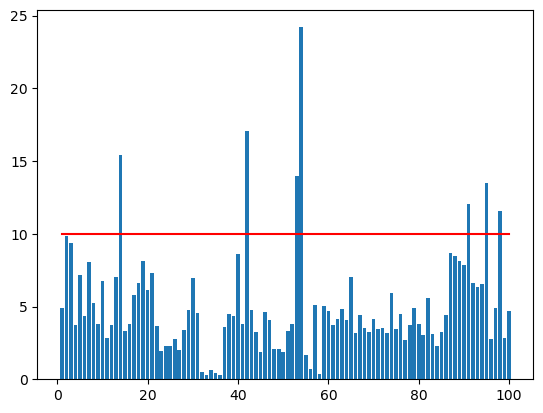

In [9]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,100], [10, 10], color = 'red')

In [10]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,6,8,0.9,0.9,10,491
1,100,0.01,7,8,0.9,0.9,0,627
2,100,0.01,5,3,0.9,0.9,1,204
3,100,0.01,1,4,0.9,0.9,75,304
4,100,0.01,7,8,0.8,0.9,100,657


In [11]:
merged_test_df.head()


,Unnamed: 0,building_number,temperature,rainfall,windspeed,humidity,hour,day,month,week,...,ess_capacity,pcs_capacity,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI
0,0,1,23.5,0.0,2.2,72,0,3,8,34,...,0.0,0.0,1627.80,1706.318118,446.882767,-2.5,0,0.000000,1.000000,58.3456
1,1,1,23.0,0.0,0.9,72,1,3,8,34,...,0.0,0.0,1550.08,1622.620235,439.662704,-5.5,0,0.258819,0.965926,57.4456
2,2,1,22.7,0.0,1.5,75,2,3,8,34,...,0.0,0.0,1431.12,1506.971294,412.071906,-8.8,0,0.500000,0.866025,57.8725
3,3,1,22.1,0.0,1.3,78,3,3,8,34,...,0.0,0.0,1372.20,1437.365647,391.205981,-12.7,0,0.707107,0.707107,57.9376
4,4,1,21.8,0.0,1.0,77,4,3,8,34,...,0.0,0.0,1381.72,1447.321412,381.099697,-16.9,0,0.866025,0.500000,56.9961


In [12]:
merged_train_df.head()

,Unnamed: 0,building_number,temperature,rainfall,windspeed,humidity,sunshine,solar_radiation,power_consumption,hour,...,ess_capacity,pcs_capacity,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI
0,0,1,18.6,0.0,0.9,42.0,0.0,0.0,1085.28,0,...,0.0,0.0,1774.744615,1706.318118,446.882767,-7.4,0,0.000000,1.000000,49.6576
1,1,1,18.0,0.0,1.1,45.0,0.0,0.0,1047.36,1,...,0.0,0.0,1687.347692,1622.620235,439.662704,-15.4,0,0.258819,0.965926,47.7625
2,2,1,17.7,0.0,1.5,45.0,0.0,0.0,974.88,2,...,0.0,0.0,1571.483077,1506.971294,412.071906,-23.7,0,0.500000,0.866025,47.2225
3,3,1,16.7,0.0,1.4,48.0,0.0,0.0,953.76,3,...,0.0,0.0,1522.153846,1437.365647,391.205981,-33.0,0,0.707107,0.707107,44.7856
4,4,1,18.4,0.0,2.8,43.0,0.0,0.0,986.40,4,...,0.0,0.0,1506.793846,1447.321412,381.099697,-40.6,0,0.866025,0.500000,49.0061


In [13]:
xgb_params.to_csv('./parameters/hyperparameter_xgb_final3_lbw.csv', index=False)

In [15]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_final3_lbw.csv')
best_it = xgb_params['best_it'].to_list()
#best_it[0]        # 1051
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,6,8,0.9,0.9,10,491
1,100,0.01,7,8,0.9,0.9,0,627
2,100,0.01,5,3,0.9,0.9,1,204
3,100,0.01,1,4,0.9,0.9,75,304
4,100,0.01,7,8,0.8,0.9,100,657


## 학습

In [16]:
preds = np.array([])
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
        x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption','sunshine','solar_radiation'], axis=1)
        x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
        x_test = x_test[x_train.columns]

        xgb = XGBRegressor(seed = seed, n_estimators = (best_it[i-1] -1), eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    

100%|██████████| 100/100 [08:43<00:00,  5.24s/it]


## 테스트

In [17]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = merged_train_df.loc[merged_train_df.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040), train_y)
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
plt.savefig('./predict_xgb3_lbw.png')


## 제출

In [18]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./data/submission_xgb_noclip3.csv', index = False)

## 1등코드 원본


In [ ]:
# from sklearn.model_selection import PredefinedSplit, GridSearchCV
# from sklearn.metrics import make_scorer
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
# preds = np.array([])

# grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
#         'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
#         'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

# for i in tqdm(np.arange(1, 101, 1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i, ].drop('power_consumption', axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

#     smape_score = make_scorer(SMAPE, graeter_is_better=False)
#     pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
#     gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#                                                  tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#                          param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)
#     # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#     #                                             tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#     #                    param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)


#     gcv.fit(x_train, y_train)
#     best = gcv.best_estimator_
#     params = gcv.best_params_
#     print(params)
#     pred = best.predict(x_test)
#     building = 'building'+str(i)
#     print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
#     preds = np.append(preds, pred)
#     df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
#     df.to_csv('./hyperparameter_xgb.csv', index = False) # save the tuned parameters

## 